In [1]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout, MaxPooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import sklearn.model_selection
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

import os
import numpy as np
from os import listdir
import shutil
import json
import math

tf.compat.v1.disable_eager_execution()

In [4]:
batch_size = 128
epochs = 15
IMG_HEIGHT = 200
IMG_WIDTH = 200
ASS_PATH = "../tf_dataset/ass"
NOT_CATEGORIZED_PATH = "../tf_dataset/notCategorized"
DATASET_PATH = "../tf_dataset/tf"
train_dir = DATASET_PATH + "/train"
validation_dir = DATASET_PATH + "/test"

In [6]:
negative_images = listdir(NOT_CATEGORIZED_PATH)
positive_images = listdir(ASS_PATH)
print('positive length', len(positive_images))
print('negative_images length', len(negative_images))

positive length 5450
negative_images length 5450


In [13]:
%%time

negative_images = negative_images[:len(positive_images)]

notass_train = round(len(negative_images)*0.9)
ass_train = round(len(positive_images)*0.9)

shutil.rmtree(DATASET_PATH, ignore_errors=True)
os.makedirs(DATASET_PATH+"/train/notass/")
os.makedirs(DATASET_PATH+"/train/ass/")
os.makedirs(DATASET_PATH+"/test/notass/")
os.makedirs(DATASET_PATH+"/test/ass/")

for file in negative_images[:notass_train]:
    shutil.copyfile(NOT_CATEGORIZED_PATH+"/"+file, DATASET_PATH+"/train/notass/"+file)
for file in negative_images[notass_train:]:
    shutil.copyfile(NOT_CATEGORIZED_PATH+"/"+file, DATASET_PATH+"/test/notass/"+file)
    
for file in positive_images[:ass_train]:
    shutil.copyfile(ASS_PATH+"/"+file, DATASET_PATH+"/train/ass/"+file)
for file in positive_images[ass_train:]:
    shutil.copyfile(ASS_PATH+"/"+file, DATASET_PATH+"/test/ass/"+file)
    
total_train = notass_train + ass_train
total_val = len(negative_images) + len(positive_images) - total_train

print('total_train', total_train)
print('total_val', total_val)

total_train 9810
total_val 1090
CPU times: user 1.04 s, sys: 5.32 s, total: 6.36 s
Wall time: 12.9 s


In [14]:
train_data_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(batch_size=batch_size,
                                                           directory=train_dir,
                                                           shuffle=True,
                                                           target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                           class_mode='binary')

val_data_gen = ImageDataGenerator(rescale=1./255).flow_from_directory(batch_size=batch_size,
                                                              directory=validation_dir,
                                                              target_size=(IMG_HEIGHT, IMG_WIDTH),
                                                              class_mode='binary',
                                                             shuffle=False)

Found 9810 images belonging to 2 classes.
Found 1090 images belonging to 2 classes.


In [15]:
# This function will plot images in the form of a grid with 1 row and 5 columns where images are placed in each column.
def plot_images(images_arr, cols=5):
    rows = math.ceil(len(images_arr) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(20,20))
    axes = axes.flatten()
    for img, ax in zip( images_arr, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()
    
def plot_images_with_class(images_arr, y, start_ind=0, cols=5):
    rows = math.ceil(len(images_arr) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(cols*4,rows*4))
    axes = axes.flatten()
    ind = 0
    for img, ax in zip( images_arr[start_ind:], axes):
        ax.imshow(img)
        ax.axis('off')
        ax.set_title('ASS' if y[start_ind+ind] == 1 else 'NOT ASS')
        ind +=1
    plt.tight_layout()
    plt.show()
    
def plot_files(files, cols=5):
    images = list(map(lambda x: mpimg.imread(x), files))
    plot_images(images, cols)

def plot_file(file):
    plt.imshow(mpimg.imread(file))
    
def plot_images_with_label(images_arr, y, start_ind=0, cols=5):
    rows = math.ceil(len(images_arr) / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(cols*4,rows*4))
    axes = axes.flatten()
    ind = 0
    for img, ax in zip( images_arr[start_ind:], axes):
        ax.imshow(img)
        ax.axis('off')
        ax.set_title('\n'.join(map(str, y[start_ind+ind])))
        ind +=1
    plt.tight_layout()
    plt.show()

In [16]:
# model = Sequential([
#     Conv2D(16, 3, padding='same', activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH ,3)),
#     MaxPooling2D(),
#     Conv2D(32, 3, padding='same', activation='relu'),
#     MaxPooling2D(),
#     Conv2D(64, 3, padding='same', activation='relu'),
#     MaxPooling2D(),
#     Flatten(),
#     Dense(512, activation='relu'),
#     Dense(1)
# ])

model = Sequential([
    Conv2D(32, 3, padding='valid', activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
    MaxPooling2D(),
    Conv2D(64, 3, padding='valid', activation='relu'),
    MaxPooling2D(),
    Conv2D(128, 3, padding='valid', activation='relu'),
    MaxPooling2D(),
    Conv2D(256, 3, padding='valid', activation='relu'),
    MaxPooling2D(),
    Flatten(),
    Dense(512, activation='relu'),
    Dense(1),
])

model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              metrics=['accuracy'])

# model.compile(optimizer=tf.keras.optimizers.Adam(),
#               loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
#               metrics=['accuracy'])

model.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 198, 198, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 99, 99, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 97, 97, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 48, 48, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 46, 46, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 23, 23, 128)       0         
_________________________________________

In [17]:
history = model.fit(
    train_data_gen,
    steps_per_epoch=total_train // batch_size,
    epochs=5,
    validation_data=val_data_gen,
    validation_steps=total_val // batch_size
)

Epoch 1/5
76/76 [==============================] - 355s 5s/step - loss: 0.6284 - accuracy: 0.6551 - val_loss: 0.5107 - val_accuracy: 0.7754
Epoch 2/5
76/76 [==============================] - 336s 4s/step - loss: 0.5237 - accuracy: 0.7363 - val_loss: 0.4756 - val_accuracy: 0.7861
Epoch 3/5
76/76 [==============================] - 329s 4s/step - loss: 0.4802 - accuracy: 0.7675 - val_loss: 0.4802 - val_accuracy: 0.7539
Epoch 4/5
76/76 [==============================] - 330s 4s/step - loss: 0.4569 - accuracy: 0.7730 - val_loss: 0.4866 - val_accuracy: 0.8066
Epoch 5/5
76/76 [==============================] - 333s 4s/step - loss: 0.4207 - accuracy: 0.7962 - val_loss: 0.4232 - val_accuracy: 0.8018


In [18]:
val_data_gen.reset()

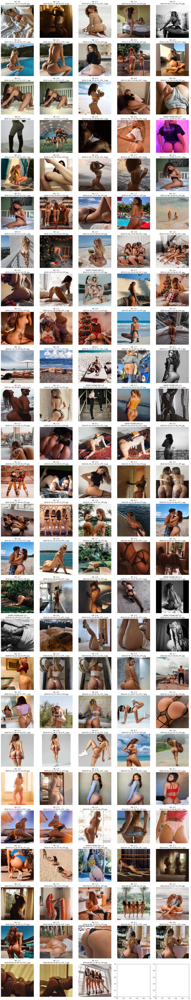

In [22]:
batch = val_data_gen.next()
flatten = lambda l: [item for sublist in l for item in sublist]
res = list(zip(flatten(model.predict(batch[0])), batch[1]))
def explain(prediction, fact):
    if fact == 0 and prediction >= 0.5:
        return 'DIDNT FOUND ASS'
    if fact == 1 and prediction < 0.5:
        return 'FALSE ASS'
    return 'OK'
batch_start_ind = (val_data_gen.batch_index-1)*val_data_gen.batch_size
def get_file_name(ind):
    return val_data_gen.filenames[batch_start_ind + ind].split("/")[-1]

res = [(explain(x[0], x[1]) + " " + str(round(x[0],1)), get_file_name(ind)) for ind,x in enumerate(res)]
plot_images_with_label(batch[0], res)